# Test agents trained by Rainbow algorithms

## Load agent and checkpoint

In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

from absl import app
from absl import flags

import marl
from third_party.dopamine import logger
from dqn_agent import DQNAgent
from hanabi_coop.agent import SimpleAgent, SimpleAgentV2
from hanabi_coop.env import HanabiMarlEnv
from hanabi_learning_environment.rl_env import HanabiInt2ActEnv, MarlWrapperEnv

import run_experiment

gin_files = ["configs/hanabi_rainbow.gin"]
# base_dir = "/home/david/Documents/Travail/Hanabi_Citi/david.albert/results/INTENTvsSimple/int2act_3"
# base_dir = "/home/david/Documents/Travail/Hanabi_Citi/david.albert/results/INTENTvsSimple/intent_no_rand"
# base_dir = "/home/david/devs/gym-env/hanabi-learning-environment/hanabi_learning_environment/agents/rainbow/tmp/rainbow_multi_simple"
base_dir = "/home/david/Bureau/home/david/Bureau"
# base_dir = "/home/david/Documents/Travail/Hanabi_Citi/david.albert/results/RainbowvsSimple/train_long"
intent_ckpt = "/home/david/Documents/Travail/Hanabi_Citi/david.albert/results/INTENTvsSimple/intent_no_rand"


run_experiment.load_gin_configs(gin_files, [])

experiment_logger = logger.Logger('{}/logs'.format(base_dir))

environment = run_experiment.create_environment("Hanabi-Full")
# environment = run_experiment.create_environment("Hanabi-Intent-any-pdn")

# environment = run_experiment.create_environment("Hanabi-Int2Act-any-pdn")
# environment.trust_rate = 0.
# if intent_ckpt is not None:
#     environment.load_intent_policy(intent_ckpt)


obs_stacker = run_experiment.create_obs_stacker(environment)
agent = run_experiment.create_agent(environment, obs_stacker, position=1)
agent.obs_stacker = obs_stacker

bot = SimpleAgent({}, action_form='int')
checkpoint_dir = '{}/checkpoints'.format(base_dir)
print("Hello")
start_iteration, experiment_checkpointer = (
    run_experiment.initialize_checkpointing(agent,
                                            experiment_logger,
                                            checkpoint_dir,
                                            'ckpt'))
# env = environment
env = MarlWrapperEnv(environment)
# env = HanabiMarlEnv({})
ag1 = bot
ag2 = agent
system = marl.MARL([ag1, ag2])
print("\n\n\nReady")


The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.





INFO:tensorflow:Creating RainbowAgent agent with the following parameters:
INFO:tensorflow:	 gamma: 0.990000
INFO:tensorflow:	 update_horizon: 1.000000
INFO:tensorflow:	 min_replay_history: 500
INFO:tensorflow:	 update_period: 4
INFO:tensorflow:	 target_update_period: 500
INFO:tensorflow:	 epsilon_train: 0.000000
INFO:tensorflow:	 epsilon_eval: 0.000000
INFO:tensorflow:	 epsilon_decay_period: 1000
INFO:tensorflow:	 tf_device: /gpu:0
INFO:tensorflow:	 use_staging: True
INFO:tensorflow:	 optimizer: <tensorflow.python.training.rmsprop.RMSPropOptimizer object at 0x7f1579e605c0>


Instructions for updating:
tf.py_func is deprecat

In [7]:

ag1 = bot
ag2 = agent

system = MARL([ag1, ag2])

In [1]:
from hanabi_learning_environment import pyhanabi
from hanabi_learning_environment import rl_env
from hanabi_learning_environment.rl_env import HanabiInt2ActEnv, MarlWrapperEnv

from marl.marl import MARL
from hanabi_coop.agent import SimpleAgent, SimpleAgentV2,SimpleAgentV3, AwwAgent

config={
    "colors":
        5,
     "random_start_player":
        True,
    "ranks":
        5,
    "players":
        2,
    "max_information_tokens":
        8,
    "max_life_tokens":
        3,
    "observation_type":
        pyhanabi.AgentObservationType.CARD_KNOWLEDGE.value
}

environment = rl_env.HanabiEnv(config=config)
env = MarlWrapperEnv(environment)

simple_agent = SimpleAgentV2(config)
simple_agent2 = SimpleAgentV2(config)

aww_agent = AwwAgent(config)
aww_agent_2 = AwwAgent(config)

ag1 = simple_agent
ag2 = simple_agent2

system = MARL([ag1, ag2])

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.




## Run test & plot hist results

In [2]:
nb_ep = 100
max_num_step = 100
id_train = "long"
# environment.trust_rate = 0.0
# 

In [3]:

res = system.test(env, nb_episodes=nb_ep, max_num_step=max_num_step,render=False)
results = res['mean_by_episode'][0][:,0]
mean = res['mean_by_episode'][1][0]
var = res['mean_by_episode'][2][0]
var = res['mean_by_episode'][2][0]
var = res['mean_by_episode'][2][0]


print("Results : ", results)
print("Mean : ", mean)
print("Mean No zero : ", sum(results)/sum(results>0))
print("Variance : ", var)


Results :  [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Mean :  0.06
Mean No zero :  2.0
Variance :  0.36932370625238803


In [4]:
res = system.test(env, nb_episodes=1, max_num_step=max_num_step,render=True)


Life tokens: 3
Info tokens: 8
Fireworks: R0 Y0 G0 W0 B0 
Hands:
Cur player
XX || XX|RYGWB12345
XX || XX|RYGWB12345
XX || XX|RYGWB12345
XX || XX|RYGWB12345
XX || XX|RYGWB12345
-----
R1 || XX|RYGWB12345
W5 || XX|RYGWB12345
Y1 || XX|RYGWB12345
B5 || XX|RYGWB12345
R1 || XX|RYGWB12345
Deck size: 40
Discards:
Step 0 - Action [{'action_type': 'REVEAL_RANK', 'rank': 0, 'target_offset': 1}, None]
Life tokens: 3
Info tokens: 7
Fireworks: R0 Y0 G0 W0 B0 
Hands:
Cur player
XX || X1|RYGWB1
XX || XX|RYGWB2345
XX || X1|RYGWB1
XX || XX|RYGWB2345
XX || X1|RYGWB1
-----
B1 || XX|RYGWB12345
Y3 || XX|RYGWB12345
R2 || XX|RYGWB12345
W2 || XX|RYGWB12345
Y3 || XX|RYGWB12345
Deck size: 40
Discards:
Step 1 - Action [None, {'action_type': 'PLAY', 'card_index': 0}]
Life tokens: 3
Info tokens: 7
Fireworks: R1 Y0 G0 W0 B0 
Hands:
Cur player
XX || XX|RYGWB12345
XX || XX|RYGWB12345
XX || XX|RYGWB12345
XX || XX|RYGWB12345
XX || XX|RYGWB12345
-----
W5 || XX|RYGWB2345
Y1 || X1|RYGWB1
B5 || XX|RYGWB2345
R1 || X1|RYGWB1
G4

AttributeError: 'MarlWrapperEnv' object has no attribute 'close'

In [6]:
import numpy as np

results = [run_experiment.run_one_episode(agent,bot, env, obs_stacker)[1] for _ in range(nb_ep)]
mean = np.mean(results)
var = np.std(results)
# mean = result/len(results)


NameError: name 'run_experiment' is not defined

In [4]:
# import plotly.express as px
import plotly as ply
import plotly.graph_objects as go
from plotly.offline import iplot
import numpy as np
# fig = px.histogram(results, x="Score", nbins=25)
x_max=25
y_max=1#max([sum(results==i) for i in range(26)])

data = [go.Histogram(x = results, xbins={"size":1}, histnorm='probability')]
fig = go.Figure(data)

fig.add_annotation(
            x=int(0.18*x_max),
            text="mean={:2.4}".format(np.mean(results)),
            showarrow=False,
            align="center",
            bordercolor="black",
            borderpad=4,
            bgcolor='rgba(200, 200, 200, .7)'
            )

fig.update_layout(title="Results for Team ({ag1}, {ag2})".format(ag1=ag1.name, ag2=ag2.name), height=500, width=700)
fig.update_xaxes(title_text="Score",range=[-0.5,x_max+0.5])
fig.update_yaxes(title_text='Frequency', range=[0,0.3])

fig.show()

In [6]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np


x_max=25
y_max=max([sum(results==i) for i in range(26)])

# Initialize figure with subplots
fig = make_subplots(
    rows=2, cols=2
)

# Add traces
fig.add_trace(go.Histogram(x = results,name="RainbowAgent"), row=1, col=1)
fig.add_annotation(
            x=int(0.18*x_max),
            y=int(0.8*y_max),
            text="mean={:2.4}".format(np.mean(results)),
            showarrow=False,
            align="center",
            bordercolor="black",
            borderpad=4,
            bgcolor='rgba(200, 200, 200, .7)'
            )
fig.add_trace(go.Histogram(x = results,name="RainbowAgent"), row=1, col=2)
fig.add_trace(go.Histogram(x = results,name="RainbowAgent"), row=2, col=1)
fig.add_trace(go.Histogram(x = results,name="RainbowAgent"), row=2, col=2)

# Update xaxis properties
fig.update_xaxes(title_text="Score", range=[-0.5, x_max+0.5], row=1, col=1)
fig.update_xaxes(title_text="Score", range=[-0.5, x_max+0.5], row=1, col=2)
fig.update_xaxes(title_text="Score", range=[-0.5, x_max+0.5], row=2, col=1)
fig.update_xaxes(title_text="Score", range=[-0.5, x_max+0.5], row=2, col=2)

# Update yaxis properties
fig.update_yaxes(title_text="Count", range=[0, y_max], row=1, col=1)
fig.update_yaxes(title_text="Count", range=[0, y_max], row=1, col=2)
fig.update_yaxes(title_text="Count", range=[0, y_max], row=2, col=1)
fig.update_yaxes(title_text="Count", range=[0, y_max], row=2, col=2)

# Update title and height
fig.update_layout(title_text="Comparaison des méthodes", height=700, width=1000)

fig.show()

In [13]:
from hanabi_learning_environment import pyhanabi
from hanabi_learning_environment import rl_env
from hanabi_learning_environment.rl_env import HanabiInt2ActEnv, MarlWrapperEnv

from marl.marl import MARL
from hanabi_coop.agent import SimpleAgent, SimpleAgentV2,SimpleAgentV3, AwwAgent

config={
    "colors":
        5,
     "random_start_player":
        True,
    "ranks":
        5,
    "players":
        2,
    "max_information_tokens":
        8,
    "max_life_tokens":
        3,
    "observation_type":
        pyhanabi.AgentObservationType.CARD_KNOWLEDGE.value
}

environment = rl_env.HanabiEnv(config=config)
env = MarlWrapperEnv(environment)


[[{'color': None, 'rank': None}, {'color': None, 'rank': None}, {'color': None, 'rank': None}, {'color': None, 'rank': None}, {'color': None, 'rank': None}], [{'color': None, 'rank': None}, {'color': None, 'rank': None}, {'color': None, 'rank': None}, {'color': None, 'rank': None}, {'color': None, 'rank': None}]]


In [4]:
from marl.marl import MARL
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np
import inspect

# list_agents = [SimpleAgent, SimpleAgentV2, SimpleAgentV3]
list_agents = [SimpleAgent, SimpleAgentV2, AwwAgent]# SimpleAgentV3, agent]
# Initialize figure with subplots
fig = make_subplots(
    rows=len(list_agents), cols=len(list_agents)
)
nb_ep = 200
x_max=25
for i in range(len(list_agents)):
    for j in range(i+1):
        ag1 =list_agents[i](config) if inspect.isclass(list_agents[i]) else list_agents[i]
        ag2 =list_agents[j](config) if inspect.isclass(list_agents[j]) else list_agents[j]

        system = MARL([ag1, ag2])

        res = system.test(env, nb_episodes=nb_ep, max_num_step=200,render=False)
        results = res['mean_by_episode'][0][:,0]
        mean = res['mean_by_episode'][1][0]

        y_max=0.3#max([sum(results==i) for i in range(26)])


        fig.add_trace(go.Histogram(x = results, xbins={"size":1}, histnorm='probability'), row=i+1, col=j+1)
        # # Add traces
        # fig.add_annotation(
        #             x=int(0.18*x_max),
        #             y=int(0.8*y_max),
        #             text="mean={:2.4}".format(np.mean(results)),
        #             showarrow=False,
        #             align="center",
        #             bordercolor="black",
        #             borderpad=4,
        #             bgcolor='rgba(200, 200, 200, .7)'
        #             )
        if i == len(list_agents)-1:
            fig.update_xaxes(title_text=ag2.name, range=[-0.5, x_max+0.5], row=i+1, col=j+1)
        else:
            fig.update_xaxes(range=[-0.5, x_max+0.5], row=i+1, col=j+1)


        if j == 0:
            fig.update_yaxes(title_text=ag1.name, range=[0, y_max], row=i+1, col=j+1)
        else:
            fig.update_yaxes(range=[0, y_max], row=i+1, col=j+1)

fig.show()


In [9]:

# Update title and height

fig.update_layout(title_text="Comparaison", height=700, width=1000)


fig.show()

Results :  [15 16 14 14 18 11 13 10 21 17 19 19 16 14  7 15 13 15 16 11  9 18 19 15
 17 20 14 14 15 20  0 15 20  9 14 14 18 16 15 12 15 12 18 19 18 17 19 21
 18 15 17 13 20 13 18 11 11 15 16 16 15 10 20 16 13 21 12 18 15 19 14 12
  0 10  0  9 15 20 13 17 15 10 19 14 16 11 14 10 11  0 15 15 13 16 14  0
 15 14 15 14 14 17 12 16 17 18 10  0 14 14 12 16 18  5 14 18 14 18 15 14
 16 15 17 16  0 13 21 18 14  8 18 17 18 15 19 13  9 13 18 10 20  7 18 15
  5 19 14 19 15 22 15 13 18 21 13  9 18 16 14 20 13  7 13 12 19 17 18  9
 12 15 21 16 17 16  0 18 11 11  8 17 19 12 15 20 13 16 15 20 17 13  0 11
 13 11 12 13 18 15 14  0 12 15 18 17 19 15 19 15 12 18 16 13 13 15 14 12
  0 20 16  9 12  5  0 15 15 15 16  9 13 17  7 15 18 12 15 13 14 20 15 13
 11 14 17  0 14 16 18 16 17 17 13 17 16 14 15 16 13 15  9 19 17 18 15 14
  9 15 18 15 16 12  0 19 17 18 18 12 14 16  9 15 14 17 19 16 14 17 14 14
 11 14 13  0 16 20  9 12 18 16  0 15 16 14 15 13 14 17 17 16 19 15 17 16
 14 12 15  0 14 14 14 12 19 19 15  9 19 

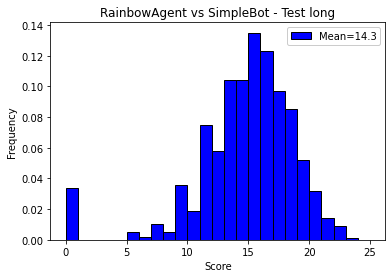

In [17]:
#### 
import matplotlib.pyplot as plt

born_sup = 25

print("Results : ", results)
print("Mean : ", mean)
print("Mean No zero : ", sum(results)/sum(results>0))
print("Variance : ", var)
# print("Percent of non-zero : ", sum(results==0))
# print("Percent of zero : ", sum(results>0))

plt.hist(results, range = (0, born_sup), bins = born_sup, color = 'blue',
            edgecolor = 'black', label='Mean={:.3}'.format(mean), density = True)

# plt.hist(results, range = (0, born_sup), bins = born_sup, color = 'red',
#             edgecolor = 'black', label='Mean={}'.format(mean))
plt.xlabel('Score')
plt.ylabel('Frequency')
plt.title('RainbowAgent vs SimpleBot - Test {}'.format(id_train))

plt.legend(framealpha=1, frameon=True)

# fig_save_name = "test-{}".format(nb_ep)
# plt.savefig("{}/{}.png".format(base_dir, fig_save_name))

## Plot learning curves 

In [10]:
import pickle
import tensorflow as tf
models =    {  
            # "dqn":"/home/david/Documents/Travail/Hanabi_Citi/david.albert/results/INTENTvsSimple/int2act_1/logs/log_508",
            # "intent_based":"/home/david/devs/gym-env/hanabi-learning-environment/hanabi_learning_environment/agents/rainbow/tmp/intent_agent_no_random/logs/log_633",
            "rainbow_dqn":"/home/david/Documents/Travail/Hanabi_Citi/david.albert/results/RainbowvsSimple/train_long/logs/log_10004",
            "rainbow_dqn_multi":"/home/david/devs/gym-env/hanabi-learning-environment/hanabi_learning_environment/agents/rainbow/tmp/rainbow_multi_simple/logs/log_3000",
            # "dqn":"/home/david/Documents/Travail/Hanabi_Citi/david.albert/results/RainbowvsSimple/train2/logs/log_417"
            }
data = []
for url in models.values():
    with tf.gfile.GFile(url, 'rb') as f:
          data.append(pickle.load(f))


In [16]:
print(data)[0]

[{'iter0': {'train_episode_lengths': [17, 10, 14, 8, 5, 13, 3, 11, 11, 10, 15, 8, 4, 18, 13, 9, 12, 15, 15, 7, 9, 9, 7, 10, 19, 5, 19, 20, 10, 10, 10, 17, 7, 10, 10, 8, 22, 7, 21, 8, 9, 8, 14, 17, 12, 11, 13, 8, 18, 12, 20, 12, 18, 11, 17, 6, 6, 4, 7, 13, 14, 12, 7, 6, 13, 20, 10, 9, 9, 12, 18, 8, 15, 9, 16, 14, 13, 8, 9, 20, 9, 10, 6, 8, 18, 11, 4, 5, 8, 9, 12, 11, 11, 4, 5, 6, 10, 19, 11, 17, 9, 7, 4, 18, 11, 11, 13, 6, 8, 9, 11, 8, 9, 12, 7, 7, 7, 9, 10, 16, 15, 14, 11, 16, 6, 7, 9, 13, 9, 16, 14, 7, 8, 6, 13, 6, 11, 17, 16, 7, 4, 11, 13, 13, 9, 8, 11, 8, 9, 6, 7, 11, 8, 10, 10, 7, 6, 8, 16, 13, 14, 6, 16, 11, 6, 10, 6, 8, 16, 18, 16, 15, 5, 16, 6, 6, 6, 14, 14, 8, 10, 13, 9, 11, 10, 5, 9, 6, 7, 10, 10, 6, 9, 16, 16, 8, 11, 5, 13, 12, 12, 8, 8, 10, 9, 19, 17, 10, 8, 17, 12, 8, 12, 9, 11, 11, 7, 10, 6, 6, 12, 16, 14, 9, 10, 10, 10, 13, 10, 10, 8, 8, 6, 12, 16, 9, 6, 10, 8, 16, 15, 6, 6, 12, 8, 14, 12, 5, 12, 6, 12, 6, 12, 8, 10, 15, 9, 8, 18, 9, 4, 6, 10, 8, 10, 9, 12, 9, 6, 8, 8, 11

TypeError: 'NoneType' object is not subscriptable

In [11]:
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objects as go
import numpy as np

rews = []
for d in data:
    rew = []
    for k,v in d.items():
        rew+=v["average_return"]
    rews.append(rew)

delta=1
rews_ma = []
for rew_l in rews:
    rew_ma = []
    for i in range(delta, len(rew_l)-delta):
        rew_ma.append(np.mean(rew_l[i-delta:i+delta]))
    rews_ma.append(rew_ma)

names=list(models.keys())

# print(rews)

fig = go.Figure()
fig.add_trace(go.Scatter(y=[13.96 for i in range(11000)], mode="lines", name="simple bot", showlegend=True))
for i in range(len(rews_ma)):
    fig.add_trace(go.Scatter(y=rews_ma[i], mode="lines", name="{}".format(names[i]), showlegend=True))
    # fig.add_annotation(
    #         x=471,
    #         y=max(rews[i]),
    #         xref="x",
    #         yref="y",
    #         text="max={:2.4}".format(max(rew)),
    #         showarrow=True,
    #         font=dict(
    #             family="Courier New, monospace",
    #             size=16,
    #             color="#ffffff"
    #             ),
    #         align="center",
    #         arrowhead=2,
    #         arrowsize=1,
    #         arrowwidth=2,
    #         arrowcolor="#636363",
    #         ax=0,
    #         ay=-30,
    #         bordercolor="#c7c7c7",
    #         borderwidth=2,
    #         borderpad=4,
    #         bgcolor='rgba({red}, 0, 0, .7)'.format(red=150+i*20),
    #         opacity=0.7
    #         )


fig.update_layout(title='Training to play with several SimpleBot',
                   xaxis_title='Iteration (150-200 episodes/iter)',
                   yaxis_title='Average Return',
                   height= 700,
                   width = 1000)

fig.update_xaxes(range=[-1, 10100])
fig.update_yaxes(range=[0, 18])

fig.show()

res = plotly.offline.plot(fig, include_plotlyjs=False, output_type='div')
# print(res)

tmp=""
with open("file.html", 'w+') as f:
    tmp+="<script src='https://cdn.plot.ly/plotly-latest.min.js'></script>"
    tmp+=res
    f.write(tmp)



## Reminder plotly

In [3]:
import plotly.io as pio
pio.renderers

Renderers configuration
-----------------------
    Default renderer: 'vscode'
    Available renderers:
        ['plotly_mimetype', 'jupyterlab', 'nteract', 'vscode',
         'notebook', 'notebook_connected', 'kaggle', 'azure', 'colab',
         'cocalc', 'databricks', 'json', 'png', 'jpeg', 'jpg', 'svg',
         'pdf', 'browser', 'firefox', 'chrome', 'chromium', 'iframe',
         'iframe_connected', 'sphinx_gallery', 'sphinx_gallery_png']

## Run detailed test

In [13]:
    
import numpy as np
from marl.tools import is_done
import matplotlib.pyplot as plt

environment.trust_rate = 0.05

frequency = {"PLAY":[0,0,0], "DISCARD":[0,0,0],"REVEAL_RANK":[0,0,0], "REVEAL_COLOR": [0,0,0]}
frequency_follow = [0,0]
simple_act = None
do_print = True

episode = 0
q_all = []
a_all = []
v_all = []

mean_rewards = np.array([])
sum_rewards = np.array([])
for episode in range(1):
    print("Episode : ", episode)

    observation = env.reset()
    system.reset()
    # env.render()
    done = False
    play = False
    for step in range(max_num_step):
        curr_player = observation[0]['current_player']
        current_player_observation = observation[curr_player]
        if do_print:
            print("Step : ", step)
            print(current_player_observation["pyhanabi"])
        action = system.greedy_action(observation)
        print(agent.state[0][-3:])
        if isinstance(system.agents[curr_player], DQNAgent):
            legal_moves = current_player_observation['legal_moves_as_int']
            legal_moves = run_experiment.format_legal_moves(legal_moves, env.num_moves(-1))
            a, q = system.agents[curr_player]._sess.run([agent._q_argmax, agent._q],
                                  {agent.state_ph: agent.state,
                                   agent.legal_actions_ph: legal_moves})
            q_all.append(list(q[0]))
            if do_print:
                print("Q value : ", q)
                print("Action : ", a)
            v_all.append(q.mean())
            # if simple_act is not None:
            #     frequency[simple_act][a] += 1
        current_player = env.state.cur_player()
        legal_moves = env.state.observation(current_player).legal_moves()
        for i, ag in enumerate(system.agents):
            if current_player == i:
                if isinstance(action[i], int):
                    for move in legal_moves:
                        if action[i] == env.game.get_move_uid(move):
                            str_action = move.to_dict()
                            break
                else:
                    str_action = action[i]

        if do_print:
            print(action)
            print(system.agents[curr_player].name," plays ",str_action)
        if isinstance(system.agents[curr_player], SimpleAgent):
            simple_act = str_action['action_type']
        observation, reward, done, _ = env.step(action)
        if str_action['action_type'] == 'PLAY':
            print("\n\n\nPlay CARD \n\n")
            play  =True
        print("Reward ",reward)   
        frequency_follow[reward[0] - int(reward[0]) != 0]+=1

        # env.render()
        sum_r = np.array(reward) if step==0 else np.add(sum_r, reward)
        if is_done(done):
            break
    mean_rewards = np.array([sum_r/step]) if episode==0 else np.append(mean_rewards, [sum_r/step], axis=0)
    sum_rewards = np.array([sum_r]) if episode==0 else np.append(sum_rewards, [sum_r], axis=0)
if do_print:
    print(sum_rewards)
    print(play)
    plt.plot(v_all)

Episode :  0
Step :  0
Life tokens: 3
Info tokens: 8
Fireworks: R0 Y0 G0 W0 B0 
Hands:
Cur player
XX || XX|RYGWB12345
XX || XX|RYGWB12345
XX || XX|RYGWB12345
XX || XX|RYGWB12345
XX || XX|RYGWB12345
-----
R3 || XX|RYGWB12345
Y4 || XX|RYGWB12345
B4 || XX|RYGWB12345
B3 || XX|RYGWB12345
G2 || XX|RYGWB12345
Deck size: 40
Discards:
Hint rank non-amb [True, False, False, False, False]
Action non ambigue:  {'action_type': 'REVEAL_RANK', 'rank': 1, 'target_offset': 1}


NameError: name 'agent' is not defined

## Plot animation Q-value

In [20]:
import pandas as pd

def get_macro_action(act):
    for m_act in ["DISCARD", "PLAY", "HINT COLOR", "HINT RANK"]:
        if m_act in act.upper():
            return m_act

df = pd.DataFrame(columns=['step','action', 'action_type', 'value'])


n_card = 5
colors=['R','Y','G','W','B'] 
ranks=[1,2,3,4,5]

actions = ['Discard {}'.format(i) for i in range(n_card)]+['Play {}'.format(i) for i in range(n_card)]+['Hint Color {}'.format(i) for i in colors]+['Hint Rank {}'.format(i) for i in ranks]
print(actions)

for i, q in enumerate(q_all):
    for j, qa in enumerate(q):
        line = [i,actions[j], get_macro_action(actions[j]), qa]
        df.loc[i*len(q)+j] = line

print(df)

['Discard 0', 'Discard 1', 'Discard 2', 'Discard 3', 'Discard 4', 'Play 0', 'Play 1', 'Play 2', 'Play 3', 'Play 4', 'Hint Color R', 'Hint Color Y', 'Hint Color G', 'Hint Color W', 'Hint Color B', 'Hint Rank 1', 'Hint Rank 2', 'Hint Rank 3', 'Hint Rank 4', 'Hint Rank 5']
    step       action action_type      value
0      0    Discard 0     DISCARD  12.051200
1      0    Discard 1     DISCARD  11.635606
2      0    Discard 2     DISCARD  11.987907
3      0    Discard 3     DISCARD  11.600196
4      0    Discard 4     DISCARD  11.920633
..   ...          ...         ...        ...
655   32  Hint Rank 1   HINT RANK  -0.132023
656   32  Hint Rank 2   HINT RANK  -0.026145
657   32  Hint Rank 3   HINT RANK  -0.015970
658   32  Hint Rank 4   HINT RANK  -0.004448
659   32  Hint Rank 5   HINT RANK  -0.221321

[660 rows x 4 columns]


In [23]:
import plotly.express as px

# df = px.data.gapminder()
print(df)
fig = px.bar(df, x="action_type", y="value", color="action_type",
  animation_frame="step", animation_group="action", range_y=[-16*5,16*5])
fig.show(renderer="browser")

step       action action_type      value
0      0    Discard 0     DISCARD  12.051200
1      0    Discard 1     DISCARD  11.635606
2      0    Discard 2     DISCARD  11.987907
3      0    Discard 3     DISCARD  11.600196
4      0    Discard 4     DISCARD  11.920633
..   ...          ...         ...        ...
655   32  Hint Rank 1   HINT RANK  -0.132023
656   32  Hint Rank 2   HINT RANK  -0.026145
657   32  Hint Rank 3   HINT RANK  -0.015970
658   32  Hint Rank 4   HINT RANK  -0.004448
659   32  Hint Rank 5   HINT RANK  -0.221321

[660 rows x 4 columns]


## Frequency analysis for intent learning

In [4]:
sum_dict = frequency.copy()
freq_simple_dict = frequency.copy()
freq_DQN_dict = frequency.copy()
sum_tot = 0
for k, v in frequency.items():
    sum_dict[k] = sum(v)
    sum_tot += sum(v)
    freq_DQN_dict[k] = [round(100*i/sum(v),1) for i in v]
freq_simple_dict = {i:round(100*j/sum_tot,1) for i,j in sum_dict.items()}
print(frequency)
print(sum_tot)
print(sum_dict)
print(freq_simple_dict)
print(freq_DQN_dict)

{'PLAY': [68, 209, 85], 'DISCARD': [41, 222, 402], 'REVEAL_RANK': [264, 1300, 89], 'REVEAL_COLOR': [374, 114, 11]}
3179
{'PLAY': 362, 'DISCARD': 665, 'REVEAL_RANK': 1653, 'REVEAL_COLOR': 499}
{'PLAY': 11.4, 'DISCARD': 20.9, 'REVEAL_RANK': 52.0, 'REVEAL_COLOR': 15.7}
{'PLAY': [18.8, 57.7, 23.5], 'DISCARD': [6.2, 33.4, 60.5], 'REVEAL_RANK': [16.0, 78.6, 5.4], 'REVEAL_COLOR': [74.9, 22.8, 2.2]}


In [13]:
print(frequency_follow)
print([v/sum(frequency_follow) for v in frequency_follow])

[308, 36]
[0.8953488372093024, 0.10465116279069768]


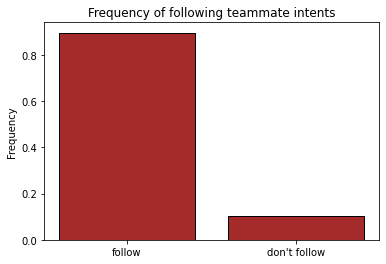

In [21]:

import matplotlib.pyplot as plt

import numpy as np
import matplotlib.pyplot as plt

proportion_follow =[v/sum(frequency_follow) for v in frequency_follow]

plt.bar([0,1],proportion_follow , color='brown', edgecolor='black', )
plt.xticks([0,1], ["follow", "don't follow"], rotation='horizontal')


plt.ylabel('Frequency')
plt.title('Frequency of following teammate intents')

# plt.legend(framealpha=1, frameon=True)

fig_save_name = "freq_follow"
plt.savefig("{}/{}.png".format(base_dir, fig_save_name))

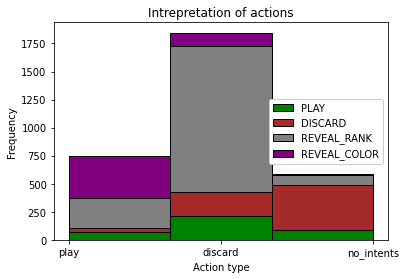

In [6]:

import matplotlib.pyplot as plt

# frequency ={'PLAY': [1, 24, 4], 'DISCARD': [159, 222, 97], 'REVEAL_RANK': [365, 2447, 0], 'REVEAL_COLOR': [351, 298, 0]}

names = {0:"play", 1:"discard",2:"no_intents"}

x = dict(zip(frequency.keys(), [[] for _ in range(len(frequency.keys()))])) 
# print(x)
for ks, vs in frequency.items():
    for i,n in enumerate(vs):
        x[ks]+=[names[i]]*n
    # print(x)

plt.hist(x.values(), bins = 3, color = ['green', 'brown', 'grey', 'purple'],
            edgecolor = 'black', hatch = '', label = x.keys(), stacked=True)

plt.xlabel('Action type')
plt.ylabel('Frequency')
plt.title('Intrepretation of actions')

plt.legend(framealpha=1, frameon=True)


fig_save_name = "interpreter-stacked-simple-v1"
plt.savefig("{}/{}.png".format(base_dir, fig_save_name))

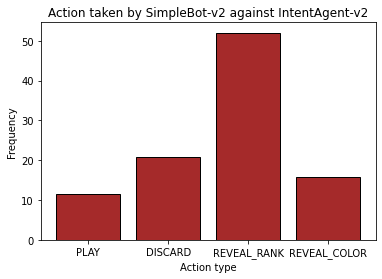

In [7]:

import matplotlib.pyplot as plt

import numpy as np
import matplotlib.pyplot as plt

dict_ = freq_simple_dict
# dict_={'PLAY': 0.7, 'DISCARD': 12.0, 'REVEAL_RANK': 70.9, 'REVEAL_COLOR': 16.4}


indices = np.arange(len(dict_.keys()))
plt.bar(indices, dict_.values(), color='brown', edgecolor='black')
plt.xticks(indices, dict_.keys(), rotation='horizontal')
# plt.tight_layout()

# x = []
# for k,v in sum_dict.items():
#     x+=[k.lower()]*v
# # print(x)
# plt.hist(x, range = (0, 4), bins = 4, color = 'blue',
#             edgecolor = 'black', density = True)

plt.xlabel('Action type')
plt.ylabel('Frequency')
plt.title('Action taken by SimpleBot-v2 against IntentAgent-v2')

# plt.legend(framealpha=1, frameon=True)

fig_save_name = "action_freq_simple_v1"
plt.savefig("{}/{}.png".format(base_dir, fig_save_name))

# Tests vrac

## Test comptes bancaires

In [43]:
import plotly.graph_objects as go

x = ['Recette', 'Depense', 'Diff']
recette = 28
depense = 10
diff = recette-depense 

colors = ['lightslategray',] * 3
colors[2] = 'crimson' if diff<0 else 'green'
width_bar = 0.8

y = [recette, depense, diff]

# Use textposition='auto' for direct text
fig = go.Figure(data=[go.Bar(
            x=x, y=y,
            text=y,
            textposition='auto',
            marker_color=colors,
            width=[width_bar, width_bar, width_bar]
        )])

fig.update_layout(title_text='Juin 2018', width=400)
fig.show()

## Autres tests

In [ ]:
import unittest

unittest.main()